# Big Data Project - Crime Data from 2010 to Present of Los Angeles


*   Yuval Heffetz 302957139
*   Maya Schvetz 305249708




**Don't forget to press the Trust button!**

# Introduction
In this project we analyze and make use of crime data from the city of Los-Angeles ([link](https://data.lacity.org/A-Safe-City/Crime-Data-8-16-8-17/dzai-xjca)). We first explore the data and look for interesting insights regarding the types of the crimes, the victims' orientation, the weapons used or the crimes and more. We than develop a few simple tools that may be used by law enforcement agencies to discover similarities between crime events and predicting the weapons used in a crime event.

In [357]:
import pandas as pd
import math
import csv
import os
from typing import Dict, List, Tuple
from os.path import exists
from datetime import datetime
import  time
import pandas as pd
import re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly_express as px
import cufflinks as cf
import pandas as pd
import numpy as np
from shapely.geometry import Point
from matplotlib.ticker import MaxNLocator
import geopandas as gpd
from IPython.display import IFrame

import math
from datetime import datetime
from dateutil import parser
sns.set()
%load_ext autoreload
%autoreload 2
%reload_ext autoreload
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# 1.  Data Exploration
In the following section we perform an extensive data exploration in order to verify the quality of the data, remove outliers and obtain interesting insights.

## 1.1. Data Preprocessing and Cleaning
We load the the dataset of crime events from 2010 to present days in the city of Los-Angeles (LA). We also load and use a geojson file containing shape polygons of the different neighborhoods of LA ([obained from here](https://data.lacity.org/A-Well-Run-City/Neighborhood-Councils-Certified-/fu65-dz2f)). We remove outliers (e.g., victims in the age of 0), re-organize date and time columns, determine the neighborhood each crime took place at and more.

In [364]:
data = pd.read_csv("Crime_Data_from_2010_to_Present.csv")
gdf = gpd.read_file(r'neighborhood_councils_losangeles.geojson')
gdf.head(3)

,name,waddress,dwebsite,nc_id,certified,service_re,cartodb_id,created_at,updated_at,geometry
0,MISSION HILLS NC,http://mhnconline.org/,http://empowerla.org/MHNC,101,2005-04-19T00:00:00,REGION 1 - NORTH EAST VALLEY,4,2015-06-19T00:00:00,2015-06-19T00:00:00,"(POLYGON ((-118.469333 34.280498, -118.469313 ..."
1,SUNLAND-TUJUNGA NC,http://stnc.org/,http://empowerla.org/STNC,10,2003-05-27T00:00:00,REGION 1 - NORTH EAST VALLEY,7,2015-06-19T00:00:00,2015-06-19T00:00:00,"(POLYGON ((-118.297041 34.278689, -118.29697 3..."
2,PICO UNION NC,http://www.picounionnc.org/,http://empowerla.org/PUNC,76,2003-06-03T00:00:00,REGION 6 - CENTRAL 2,8,2015-06-19T00:00:00,2015-06-19T00:00:00,"(POLYGON ((-118.279843 34.051718, -118.279256 ..."


In [1]:
def get_neighborhood(row):
    """
    Used for determining the neighborhood a point is located at 
    Args:
        param: row. a row with LAT, LON coordintaes
    Returns:
        The neighborhood name or None if doesn't belong to any
    """
    point = Point(row['LON'], row['LAT'])
    for _, r in gdf.iterrows():
        if r['geometry'].contains(point):
            return r['name']
    return None



def data_preprocessing(data):
    """
    Data preprocessing and outliers removal for the remainer of the project
    Args:
        param: data. dataframe.
    Returns:
        The processed dataframe
    """
    data = data[data['Vict Age']>0]
    data['Vict Sex'] = data['Vict Sex'].apply(lambda x: 1 if x=='M' else 0 if x=='F' else math.nan )
    data['Date Occ Only'] = data['DATE OCC'].apply(lambda x: parser.parse(x).date())
    data['Date Occ Year'] = data['Date Occ Only'].apply(lambda x: x.year)
    data['Month'] = data['Date Occ Only'].apply(lambda x: x.month)
    data['Time'] = data['TIME OCC'].apply(lambda x: '00:0'+str(x) if len(str(x))==1 else '00:'+str(x) if len(str(x))==2 else '0'+str(x)[0]+':'+str(x)[1:] if len(str(x))==3 else str(x)[0:2]+':'+str(x)[2:4])
    data['Time'] = data['Time'].apply(lambda x: datetime.strptime(x, '%H:%M').time())
    data['Hour'] = data['Time'].apply(lambda x: x.hour)
    days=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
    data['Week Day'] = data['Date Occ Only'].apply(lambda x: days[x.weekday()])
    Descent = {'A': 'Other Asian', 'B': 'Black', 'C':'Chinese', 'D': 'Cambodian', 'F': 'Filipino', 'G': 'Guamanian',
               'H': 'Hispanic/Latin/Mexican', 'I': 'American Indian/Alaskan Native', 'J': 'Japanese', 'K': 'Korean',
               'L': 'Laotian', 'O': 'Other', 'P': 'Pacific Islander', 'S': 'Samoan', 'U':'Hawaiian', 'V': 'Vietnamese',
               'W': 'White', 'X': 'Unknown', 'Z': 'Asian Indian'}
    data['Vict Descent'] = data['Vict Descent'].apply(lambda x: Descent[x] if x in Descent else x)
    Status = {'Invest Cont':'Investigation Continues', 'Juv Arrest':'Juvenile Arrest', 'Juv Other': 'Juvenile Other', 'UNK': 'Unknown'}
    data['Status Desc'] = data['Status Desc'].apply(lambda x: Status[x] if x in Status else x)
    data[["Date Occ Year", "Hour"]] = data[["Date Occ Year", "Hour"]].apply(pd.to_numeric)
    data['neighborhood'] = data.apply(get_neighborhood, axis=1)
    return data

In [368]:
data = data_preprocessing(data)
data.to_csv('neighb_preprocessed_data.csv')
data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,Cross Street,LAT,LON,Date Occ Only,Date Occ Year,Month,Time,Hour,Week Day,neighborhood
0,1307355,02/20/2010 12:00:00 AM,02/20/2010 12:00:00 AM,1350,13,Newton,1385,2,900,VIOLATION OF COURT ORDER,...,NaN,33.9825,-118.2695,2010-02-20,2010,2,13:50:00,13,Saturday,COMMUNITY AND NEIGHBORS FOR NINTH DISTRICT UNI...
3,90631215,01/05/2010 12:00:00 AM,01/05/2010 12:00:00 AM,150,6,Hollywood,646,2,900,VIOLATION OF COURT ORDER,...,HOLLYWOOD BL,34.1016,-118.3295,2010-01-05,2010,1,01:50:00,1,Tuesday,CENTRAL HOLLYWOOD NC
4,100100501,01/03/2010 12:00:00 AM,01/02/2010 12:00:00 AM,2100,1,Central,176,1,122,"RAPE, ATTEMPTED",...,SAN PEDRO ST,34.0387,-118.2488,2010-01-02,2010,1,21:00:00,21,Saturday,DOWNTOWN LOS ANGELES
5,100100506,01/05/2010 12:00:00 AM,01/04/2010 12:00:00 AM,1650,1,Central,162,1,442,SHOPLIFTING - PETTY THEFT ($950 & UNDER),...,NaN,34.0480,-118.2577,2010-01-04,2010,1,16:50:00,16,Monday,DOWNTOWN LOS ANGELES
6,100100508,01/08/2010 12:00:00 AM,01/07/2010 12:00:00 AM,2005,1,Central,182,1,330,BURGLARY FROM VEHICLE,...,GRAND AV,34.0389,-118.2643,2010-01-07,2010,1,20:05:00,20,Thursday,DOWNTOWN LOS ANGELES


## 1.2. Dataset Statistics
Display basic statistics of the numeric columns of the dataset

In [7]:
data.describe().round(2)

,DR_NO,TIME OCC,AREA,Rpt Dist No,Part 1-2,Crm Cd,Vict Age,Vict Sex,Premis Cd,Weapon Used Cd,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LAT,LON,Date Occ Year,Hour
count,1.650495e+06,1650495.00,1650495.00,1650495.00,1650495.0,1650495.00,1650495.00,1645246.0,1650471.00,637061.00,1650487.00,107112.00,2986.00,95.00,1650495.00,1650495.00,1650495.00,1650495.00
mean,1.450828e+08,1346.40,11.07,1153.56,1.5,505.91,38.48,0.5,330.62,372.92,505.72,944.73,971.66,972.94,34.06,-118.31,2014.34,13.30
std,2.758280e+07,645.61,6.06,606.03,0.5,220.34,16.02,0.5,210.91,111.35,220.20,131.48,87.33,84.75,0.73,2.51,2.76,6.45
min,1.208575e+06,1.00,1.00,100.00,1.0,110.00,2.00,0.0,101.00,101.00,110.00,210.00,93.00,421.00,0.00,-118.83,2010.00,0.00
25%,1.211175e+08,919.00,6.00,643.00,1.0,330.00,26.00,0.0,104.00,400.00,330.00,998.00,998.00,998.00,34.01,-118.44,2012.00,9.00
50%,1.501087e+08,1400.00,11.00,1183.00,1.0,440.00,36.00,0.0,404.00,400.00,440.00,998.00,998.00,998.00,34.06,-118.33,2014.00,14.00
75%,1.706236e+08,1900.00,16.00,1677.00,2.0,648.00,49.00,1.0,501.00,400.00,647.00,998.00,998.00,998.00,34.18,-118.28,2017.00,19.00
max,1.999057e+08,2359.00,21.00,2199.00,2.0,956.00,118.00,1.0,971.00,516.00,956.00,999.00,999.00,999.00,34.79,0.00,2019.00,23.00


## 1.3. Missing Data Analysis

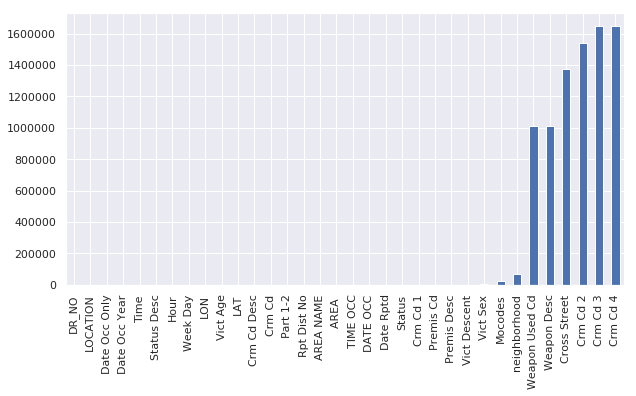

In [43]:
data_missing = data.isna()
data_missing_numbers = data_missing.sum()
data_missing_numbers = data_missing_numbers.sort_values()
f, ax1 = plt.subplots(1, 1, sharex=True, figsize=(10, 5))
data_missing_numbers.plot.bar()

We can see that in most of the columns we don't have missing data. Missing data in the columns 'Cm cd2', 'Cm cd3', 'Cm cd4' make sense since there description suggest that they: "May contain a code for an additional crime, less serious than Crime Code 1."
Regarding to the weapon field missing values - not in all crimes a weapon is in use or known.

## 1.4. Obtaining Insights from the Data

### 1.4.1. Types of Crimes
First, let's see the number of crime types that exist in the sdataset, using the **Crm Cd Desc** column:

In [402]:
print('There are {} crime types'.format(len(data['Crm Cd Desc'].unique())))

There are 139 crime types


#### 1.4.1.1. Word-Cloud
Since the number of types is quite large and some types are devided into multiple sub-types (e.g. **THEFT**-GRAND, PETTY **THEFT**,...), we want to further analyze the types and see which words are most frequent when describing the crime types so we can obtain the more general types of crimes:

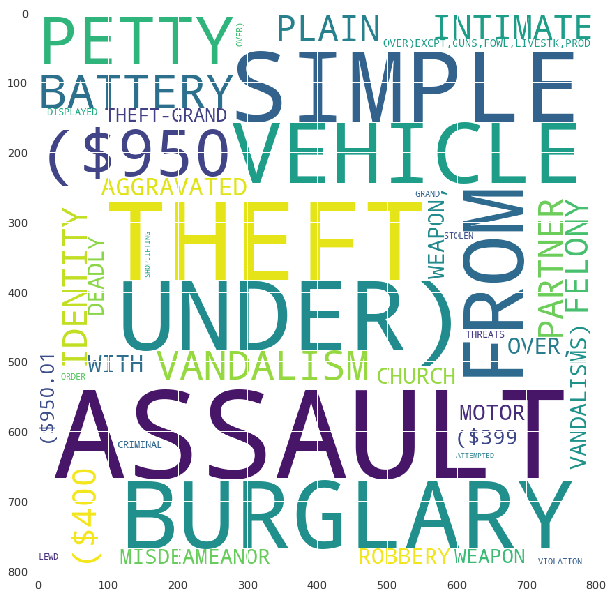

In [573]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from collections import Counter
%matplotlib inline

def draw_word_cloud(words_list, min_times=10):
    """
    Draws a wordcloud
    Args:
        param1: words_list. list of the words.
        param2: min_times. minimum word counts to decide whether to display the word.
    """
    stopwords = set(STOPWORDS) | {"doc", "date","memo", "subject", 'state',
                                 }
    stopwords_parts = {"'s", " ' s'", " `s" }
    wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                    stopwords = stopwords, 
                    min_font_size = 10)
    def skip_entity(e):
        if e in stopwords:
            return True
        for p in stopwords_parts:
            if p in e:
                return True
        return False
    c = Counter(words_list)
    # using the subject frquencies
    d = {k:v for k,v in dict(c).items() if v > min_times and not skip_entity(k)}
    wordcloud.generate_from_frequencies(d)
    plt.figure(figsize = (10, 20), facecolor = None) 
    plt.imshow(wordcloud)

find_most_common_Crimes = []
for row in data['Crm Cd Desc']:
    for word in row.split(' '):
        if len(word)>3:
            find_most_common_Crimes.append(word) 

draw_word_cloud(find_most_common_Crimes, min_times=20)

#### 1.4.1.2. Top Crime Types Visualization
By just looking on the crime description word cloud plot we can learn what are the main crimes- assault, theft, burglary and vandalism. We continue the analysis by identifying the top crime types and re-configuring each crime event type to one of the three more general crime types - THEFT (includes also burglary), ASSAULT and VANDALISM.

Let's see first what are the 15 most common crime types in the dataset:

No handles with labels found to put in legend.


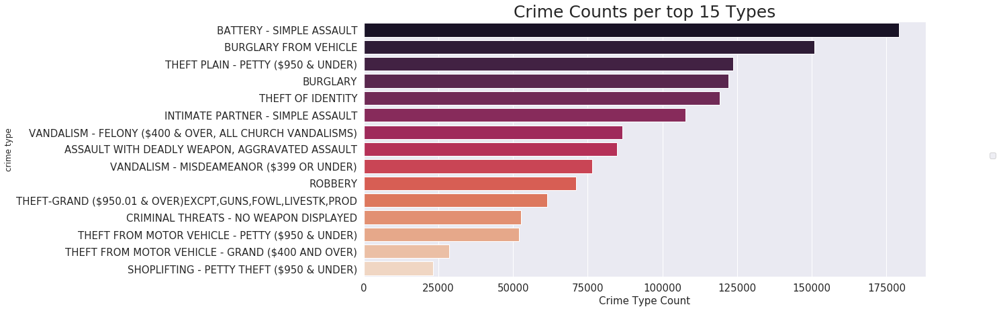

In [403]:
top_crime_types = pd.DataFrame(data['Crm Cd Desc'].value_counts()[:15]).reset_index().rename(columns={"index": "crime type", 'Crm Cd Desc': 'count'})

f, ax1 = plt.subplots(1, 1, sharex=True, figsize=(15, 7))
g = sns.barplot(x=top_crime_types['count'],y=top_crime_types['crime type'], palette="rocket")
f.legend(loc = 'right')
g.set_title("Crime Counts per top 15 Types", fontsize=25)
# g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Crime Type Count",fontsize=15)
g.tick_params(labelsize=15)

In [401]:
top_crime_types['count'].sum()/data.shape[0]

0.8116734676566727

**We can see that the top 15 types (out of 139) constitute 81.16 percent of the crimes**. From each of the 15 types we obtain the more general crime type (1 of the 3 types) and add it as an additional column to the table: 

In [560]:
top_crime_list = top_crime_types['crime type'].tolist()
assault_crimes = [i for i in top_crime_list if 'ASSAULT' in i]
theft_crimes = [i for i in top_crime_list if ('THEFT' in i or 'ROBBERY' in i or 'BURGLARY' in i) and not i=='THEFT OF IDENTITY']
vandalism_crimes = [i for i in top_crime_list if 'VANDALISM' in i]

top_data = data[data['Crm Cd Desc'].isin(theft_crimes+assault_crimes+vandalism_crimes)][['Crm Cd Desc', 'Date Occ Year', 'Month', 'LAT', 'LON']]
def get_type(code):
    """
    Return the general type of a crime code.
    Args:
        param: code. the code of the crime.
    Returns:
        The general crime type type
    """
    if code in assault_crimes:
        return 'ASSAULT'
    elif code in theft_crimes:
        return 'THEFT'
    elif code in vandalism_crimes:
        return 'VANDALISM'
    else:
        return 'OTHER'
top_data['Crime Type'] = top_data['Crm Cd Desc'].apply(lambda x: get_type(x))
top_data = top_data[top_data['Crime Type'] != 'OTHER']
top_data.head()

,Crm Cd Desc,Date Occ Year,Month,LAT,LON,Crime Type
5,SHOPLIFTING - PETTY THEFT ($950 & UNDER),2010,1,34.0480,-118.2577,THEFT
6,BURGLARY FROM VEHICLE,2010,1,34.0389,-118.2643,THEFT
7,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",2010,1,34.0435,-118.2427,ASSAULT
8,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",2010,1,34.0450,-118.2640,ASSAULT
9,"THEFT-GRAND ($950.01 & OVER)EXCPT,GUNS,FOWL,LI...",2010,1,34.0538,-118.2488,THEFT


**Crime type map:** We use the resulting table to visualize on a map of LA the crimes by their types. We define a function that given a year and a month, plots all the crimes by their type on the LA map. We use the Folium package for that purpose:

In [604]:
from branca.element import Template, MacroElement

def crime_type_map(crime_data, year, month):
    """
    Plots LA map with dots representing crimes by their general type.
    Args:
        param1: crime_data. 
        param2: year. The year we want to filter the crime_data by.
        param3: month. The month we want to filter the crime_data by.
    """
    crime_data = crime_data[crime_data['Date Occ Year']==year].reset_index(drop=True)
    crime_data = crime_data[crime_data['Month']==month].reset_index(drop=True)
    m = folium.Map(location=[34.052, -118.2437], zoom_start = 11, prefer_canvas=True) 
    for i in range(len(crime_data)):
        if crime_data.iloc[i]['Crime Type'] == 'THEFT':
            folium.Circle([crime_data.iloc[i]['LAT'], crime_data.iloc[i]['LON']], popup=crime_data.iloc[i]['Crm Cd Desc'], radius=0.8, color='green', fill_color='green').add_to(m)
        elif crime_data.iloc[i]['Crime Type'] == 'ASSAULT':        
            folium.Circle([crime_data.iloc[i]['LAT'], crime_data.iloc[i]['LON']], popup=crime_data.iloc[i]['Crm Cd Desc'], radius=0.8, color='red', fill_color='red').add_to(m)
        elif crime_data.iloc[i]['Crime Type'] == 'VANDALISM':        
                folium.Circle([crime_data.iloc[i]['LAT'], crime_data.iloc[i]['LON']], popup=crime_data.iloc[i]['Crm Cd Desc'], radius=0.8, color='blue', fill_color='blue').add_to(m)
    template = """
    {% macro html(this, kwargs) %}

    <!doctype html>
    <html lang="en">
    <head>
      <meta charset="utf-8">
      <meta name="viewport" content="width=device-width, initial-scale=1">
      <title>jQuery UI Draggable - Default functionality</title>
      <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

      <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
      <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>

      <script>
      $( function() {
        $( "#maplegend" ).draggable({
                        start: function (event, ui) {
                            $(this).css({
                                right: "auto",
                                top: "auto",
                                bottom: "auto"
                            });
                        }
                    });
    });

      </script>
    </head>
    <body>


    <div id='maplegend' class='maplegend' 
        style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
         border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 450px;'>

    <div class='legend-title'>Crime Type</div>
    <div class='legend-scale'>
      <ul class='legend-labels'>
        <li><span style='background:red;opacity:0.7;'></span>ASSAULT</li>
        <li><span style='background:blue;opacity:0.7;'></span>VANDALISM</li>
        <li><span style='background:green;opacity:0.7;'></span>THEFT</li>

      </ul>
    </div>
    </div>

    </body>
    </html>

    <style type='text/css'>
      .maplegend .legend-title {
        text-align: left;
        margin-bottom: 5px;
        font-weight: bold;
        font-size: 90%;
        }
      .maplegend .legend-scale ul {
        margin: 0;
        margin-bottom: 5px;
        padding: 0;
        float: left;
        list-style: none;
        }
      .maplegend .legend-scale ul li {
        font-size: 80%;
        list-style: none;
        margin-left: 0;
        line-height: 18px;
        margin-bottom: 2px;
        }
      .maplegend ul.legend-labels li span {
        display: block;
        float: left;
        height: 16px;
        width: 30px;
        margin-right: 5px;
        margin-left: 0;
        border: 1px solid #999;
        }
      .maplegend .legend-source {
        font-size: 80%;
        color: #777;
        clear: both;
        }
      .maplegend a {
        color: #777;
        }
    </style>
    {% endmacro %}"""

    macro = MacroElement()
    macro._template = Template(template)
    m.get_root().add_child(macro)
    
    return m

In [605]:
m = crime_type_map(top_data, year=2019, month=6)
m.save('map.html')
IFrame(src='map.html', width=1000, height=600)

**We can see that in june 2019, all 3 types of crimes occured the at all the areas of LA**, but that some areas, such as Beverley-Hills and West Hollywood, were more affected by theft than assault or vandalism and that assaults were more common in central LA.

### 1.4.2. Crime Victims Analysis
Analysis of the different information about the victims of the crimes

#### 1.4.2.1. Victim Counts by Age and Gender
Lets look at the distribution plots of the crime counts by their victim age, and compare Male vs. Female:

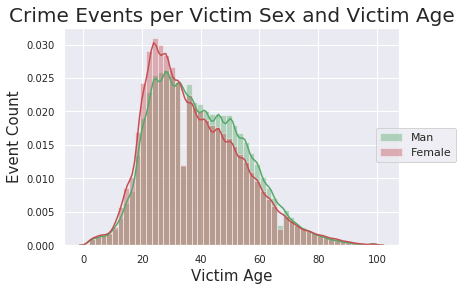

In [341]:
f, ax1 = plt.subplots(1, 1, sharex=True)
g = sns.distplot(data[data['Vict Sex'] == 1]['Vict Age'], axlabel="Vict Age", color='g', label='Man')
g = sns.distplot(data[data['Vict Sex'] == 0]['Vict Age'], axlabel="Vict Age", color='r', label = 'Female')
f.legend(loc = 'right')
g.set_title("Crime Events per Victim Sex and Victim Age", fontsize=20)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Victim Age",fontsize=15)
g.tick_params(labelsize=10)

**We can see that we get similar events distribution for men and females crime victims by their age** and that most victims are in their twenties.

#### 1.4.2.1. Victim Counts by their Descent
The datasets also contains information about the victim's descent of each crime. Here we plot the crime count by the victims descent:

No handles with labels found to put in legend.


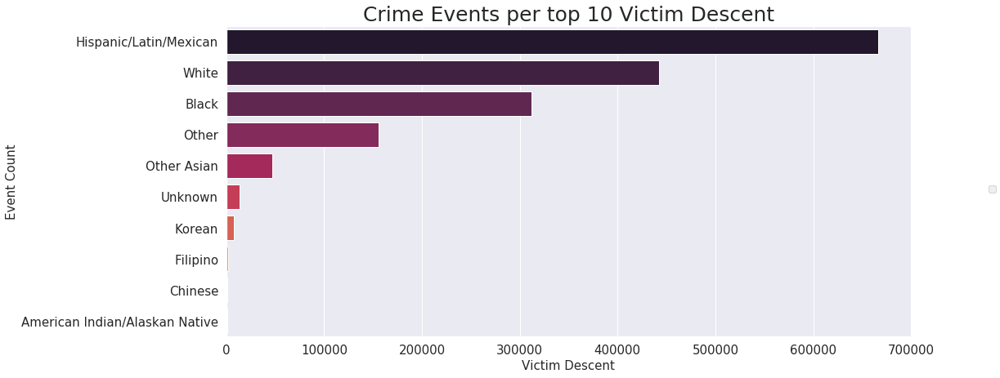

In [44]:
f, ax1 = plt.subplots(1, 1, sharex=True, figsize=(15, 7))
group = data.groupby(["Vict Descent"])['Vict Descent'].agg(['count'])
group = group.reset_index(level=['Vict Descent'])
group = group.sort_values("count", ascending=False).head(10)
g = sns.barplot(x=group['count'],y=group['Vict Descent'], palette="rocket")
f.legend(loc = 'right')
g.set_title("Crime Events per top 10 Victim Descent", fontsize=25)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Victim Descent",fontsize=15)
g.tick_params(labelsize=15)

We can see that most victims descents are Hispanic or Latin or Mexican

#### 1.4.2.2. Victim Descent Map Visualization of Homicide Crimes
In order to find out whether the location of the crime might indicate what is the descent of the victim we visualize the crime events on a map, colored by the descent of the victims. We decided to focus on the most severe crime of the dataset - criminal homicide. To simplify the data we considered Chinese, Koreans and Filipinos as Asians:

In [674]:
homicides_data = data[data['Crm Cd Desc']=='CRIMINAL HOMICIDE'][['LAT', 'LON', 'Vict Descent', 'Vict Sex']]
homicides_data = homicides_data.replace(['Other Asian','Korean', 'Filipino', 'Chinese'], 'ASIAN')
homicides_data = homicides_data[homicides_data['Vict Descent']!='Other'].reset_index(drop=True)
m = folium.Map(location=[34.022, -118.2437], zoom_start = 10.45, prefer_canvas=True) 

females = folium.FeatureGroup("Females")
men = folium.FeatureGroup("Men")

for i in range(len(homicides_data)):
    if homicides_data.iloc[i]['Vict Descent'] == 'Hispanic/Latin/Mexican':  
        if homicides_data.iloc[i]['Vict Sex'] == 1:
            men.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='blue', fill_color='blue'))
        else:
            females.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='blue', fill_color='blue'))
    elif homicides_data.iloc[i]['Vict Descent'] == 'Black':
        if homicides_data.iloc[i]['Vict Sex'] == 1:
            men.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='green', fill_color='blue'))
        else:
            females.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='green', fill_color='blue'))
    elif homicides_data.iloc[i]['Vict Descent'] == 'White':        
        if homicides_data.iloc[i]['Vict Sex'] == 1:
            men.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='red', fill_color='blue'))
        else:
            females.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='red', fill_color='blue'))
    elif homicides_data.iloc[i]['Vict Descent'] == 'ASIAN':        
        if homicides_data.iloc[i]['Vict Sex'] == 1:
            men.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='black', fill_color='blue'))
        else:
            females.add_child(folium.Circle([homicides_data.iloc[i]['LAT'], homicides_data.iloc[i]['LON']], radius=0.25, color='black', fill_color='blue'))

men.add_to(m)
females.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

template = """
{% macro html(this, kwargs) %}
<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">
  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});
  </script>
</head>
<body>
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 10px; bottom: 350px;'>

<div class='legend-title'>Victim Decsent</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:0.7;'></span>White</li>
    <li><span style='background:blue;opacity:0.7;'></span>Latin</li>
    <li><span style='background:green;opacity:0.7;'></span>Black</li>
    <li><span style='background:black;opacity:0.7;'></span>Asian</li>
  </ul>
</div>
</div>
</body>
</html>
<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 64px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)
m.get_root().add_child(macro)

m

**Unfortunately, we can see a clear division** of the homicides locations by the descent of the victims. This might indicate that LA population is devided by the descent of its people to different areas of the city. We can also see that the white population is much less affected by murders compared to the blacks or latin populations. 

### 1.4.3. Crime Events Analysis by Weapon Types
(1) Crime counts by weapon type and (2) crime counts by weapon in respect to year, hour of the day and vitim gender interactively: 

No handles with labels found to put in legend.


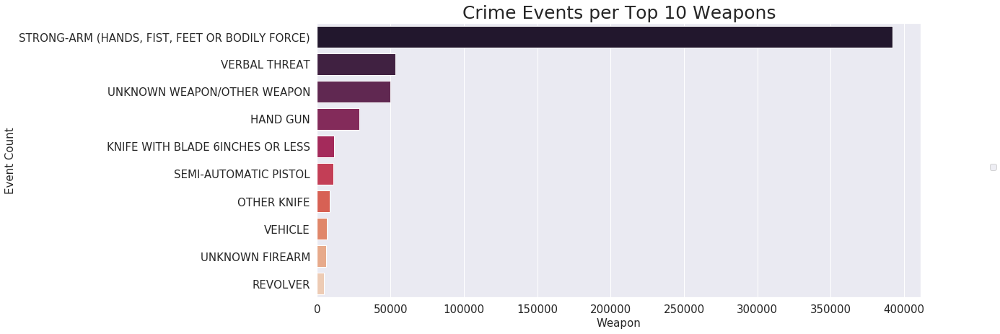

In [45]:
f, ax1 = plt.subplots(1, 1, sharex=True, figsize=(15, 7))
group = data.groupby(["Weapon Desc"])['Weapon Desc'].agg(['count'])
group = group.reset_index(level=['Weapon Desc'])
group = group.sort_values("count", ascending=False).head(10)
Weapon_most_common = group['Weapon Desc'].to_list()
g = sns.barplot(x=group['count'],y=group['Weapon Desc'], palette="rocket")
f.legend(loc = 'right')
g.set_title("Crime Events per Top 10 Weapons", fontsize=25)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Weapon",fontsize=15)
g.tick_params(labelsize=15)

We can see that the weapon that is most in use is by hand and verbal threats

In [46]:
Weapon_most_common_ds = data[data['Weapon Desc'].isin(Weapon_most_common)] 
Weapon_most_common_ds['Vict Sex des'] = Weapon_most_common_ds['Vict Sex'].apply(lambda x: 'Male' if x==1 else 'Female' if x==0 else 'Unknown' )
Weapon_most_common_ds = Weapon_most_common_ds[Weapon_most_common_ds['Vict Sex des'].isin(['Male','Female'])] 
Weapon_most_common_ds['Weapon Desc'] = Weapon_most_common_ds['Weapon Desc'].apply(lambda x: x[0:20] )
group = Weapon_most_common_ds.groupby(["Weapon Desc",'Hour','Date Occ Year','Vict Sex des'])['Weapon Desc'].agg(['count'])
group = group.reset_index(level=["Weapon Desc",'Hour','Date Occ Year','Vict Sex des'])
px.scatter(group, x="Hour", y="count", animation_frame="Date Occ Year",# animation_group="Vict Sex des",
           size="count", color="Weapon Desc",title='Case Number Aginst Female and Man by Weapon Over Hours and Years', facet_col ="Vict Sex des")

We can see that females are more attacked than men and that the trend stays the same throw the years. In addition, we can see that there are much more attacks by hand than by other ways and that at night we have more attacks than in daylight. <br>
-In 2019 we can see a decrease in the number of event compare to the other years, that is because the year is still not over (we can see the same behavior on the next plots too)

### 1.4.4. Crime Events Status Count Over the Years


In [16]:
group = data.groupby(["Status Desc",'Date Occ Year'])['Status Desc'].agg(['count'])
group = group.reset_index(level=["Status Desc",'Date Occ Year'])
px.bar(group, x="Status Desc", y="count", animation_frame="Date Occ Year", color="Status Desc", 
       title='Case Status Number Over the Years') 

We can see that we have much more open investigations than other cases statues. In addition, we can see that the adults arrest number is higher than the juvenile arrest number and that the trend stays the same over the years. 

### 1.4.5. Crime Analysis by Area
**The LAPD has 21 Community Police Stations referred to as Geographic Areas within the department.**
We will try to reveal some insights about those areas.

#### 1.4.5.1. Heat-Map Over Time
We first present a heat-map of the crime events in LA over time in an interactive map (using Folium). The map also contains markers denoting the locations of the 21 LAPD police stations, using a geojson with the stations coordinates. Hover over a marker to see the name of the station's division. Press the Play button to see the heat-map progress over time (month/year).

In [249]:
import folium
from sklearn.utils import shuffle
from folium.plugins import HeatMapWithTime
m = folium.Map(location=[34.022, -118.2437], zoom_start = 10.47) # , tiles = tiles
data_location = data[['LAT','LON','Date Occ Only']]
data_location = shuffle(data_location)[:66000]
data_location['Year'] = data_location['Date Occ Only'].apply(lambda x: x.year)
data_location['Month'] = data_location['Date Occ Only'].apply(lambda x: x.month)
data_location['time_lapse'] = data_location.apply(lambda x: x['Year']+x['Month']/100, axis=1)
data_l = [data_location[data_location['time_lapse']==data_location['time_lapse'].unique()[i]][['LAT','LON']].values.tolist() 
        for i in range(len(data_location['time_lapse'].unique()))]
index = [str(int(round((i%1)*100)))+'/'+str(int(i-(i%1))) for i in sorted(data_location['time_lapse'].unique())]
HeatMapWithTime(data_l, index=index, radius=6, auto_play=True).add_to(m)

In [250]:
LAPD_stations = gpd.read_file(r'LAPD_Police_Stations.geojson')
folium.GeoJson(LAPD_stations, name='DIVISION', tooltip=folium.features.GeoJsonTooltip(fields=['DIVISION'])).add_to(m)
m

#### 1.4.5.2. Choropleth Map of the LAPD Areas
In this map we visualize the number of incidents that occured in the different areas of LA (the 21 LAPD divisions areas). The areas' polygons were obtained from a geojson file of the LAPD divisions areas ([obained from here](http://boundaries.latimes.com/set/lapd-divisions/)). Hover over each area and see its name and the crimes count of the area.

In [85]:
LAPD_AREAS_gdf = gpd.read_file(r'lapd_divisions.json')
data = data.replace('N Hollywood', 'North Hollywood')
data = data.replace('West LA', 'West Los Angeles')
LAPD_AREAS_gdf['style'] = [ 
    {'fillColor': [0,0,0], 
    'fillOpacity': 0.0, 
    'weight': 0.2, 
    'color': 'black'}]*len(LAPD_AREAS_gdf)

In [223]:
group_area = data.groupby(['AREA NAME'])['AREA NAME'].agg(['count']).reset_index()
LAPD_AREAS_gdf['count'] = LAPD_AREAS_gdf.apply(lambda r: group_area[group_area['AREA NAME']==r['name']]['count'].values[0], axis=1)

la_geo = r'lapd_divisions.json'

m = folium.Map(location = [34.015, -118.26], zoom_start = 10)

a = folium.Choropleth(
    geo_data = r'lapd_divisions.json',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    data = group_area,
    key_on = 'feature.properties.name',
    columns = ['AREA NAME', 'count'],
    fill_color = 'OrRd',
    name='Number of crimes',
    legend_name = 'bi'
)
a.add_to(m)

folium.GeoJson(data=LAPD_AREAS_gdf,
               name='LAPD DIV',smooth_factor=2,
               style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.2},
                tooltip=folium.GeoJsonTooltip(fields=['count', 'name'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':0.6,'fillColor':'grey'}
              ).add_to(m)
m

We can see that the more troubled areas are **Southwest** and **77th Street**. This also can be seen in the heat-map of the cell above. 

#### 1.4.5.3. Crime Counts in the different Areas - Further Analysis 
We further analyze the data per area - by year, by hour of the day and by day of the week.

##### 1.4.5.3.1. By Year

/data/home/yuvalhef/anaconda3/envs/venv/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



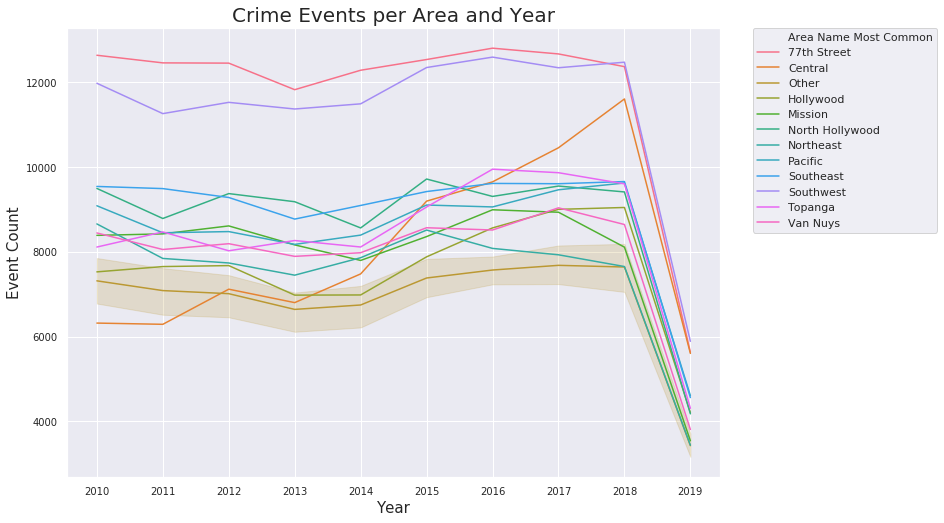

In [55]:
group = data.groupby(["Date Occ Year", 'AREA NAME'])['AREA NAME'].agg(['count'])
results_group = group.reset_index(level=['Date Occ Year',  'AREA NAME'])
group_area = data.groupby(['AREA NAME'])['AREA NAME'].agg(['count'])
results_group_area = group_area.reset_index(level=[ 'AREA NAME'])
results_group_area['Area Name Most Common'] = results_group_area[['count','AREA NAME']].apply(lambda x: x['AREA NAME'] if x['count']>75000 else 'Other', axis=1)
# results_group_area.sort_values('count', ascending= False).reset_index()
results_group = results_group.merge(results_group_area, on = 'AREA NAME')

f, ax = plt.subplots(figsize=(11.7, 8.27))
g = sns.lineplot(ax=ax,x="Date Occ Year", y="count_x", hue='Area Name Most Common',data=results_group)
g.set_title("Crime Events per Area and Year", fontsize=20)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Year",fontsize=15)
g.tick_params(labelsize=10)

plt.xticks(np.arange(2010, 2020, step=1))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

We can see that the number of crime events stayed almost the same in most areas except in the central where there was an increase in the event number in 2018. In addition, we can see that '77th street' and 'Southwest' are the areas we the highest event number per year. 

##### 1.4.5.3.2. By Hour

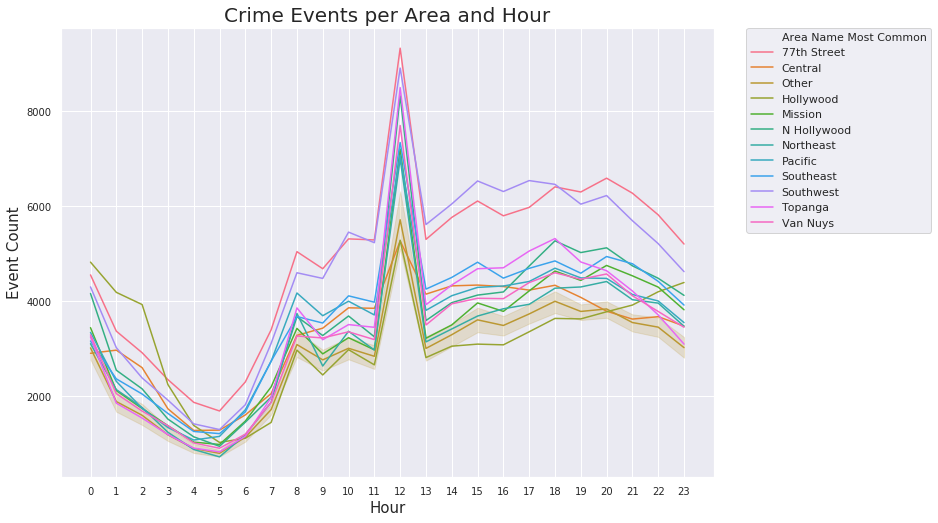

In [18]:
group = data.groupby(["Hour", 'AREA NAME'])['AREA NAME'].agg(['count'])
results_group = group.reset_index(level=['Hour',  'AREA NAME'])

results_group = results_group.merge(results_group_area, on = 'AREA NAME')

f, ax = plt.subplots(figsize=(11.7, 8.27))
g = sns.lineplot(ax=ax,x="Hour", y="count_x", hue='Area Name Most Common',data=results_group)
g.set_title("Crime Events per Area and Hour", fontsize=20)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Hour",fontsize=15)
g.tick_params(labelsize=10)

plt.xticks(np.arange(0, 24, step=1))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


We can see that in the early morning there is a decrease in the events number and an increase during noon.

##### 1.4.5.3.3. By Day

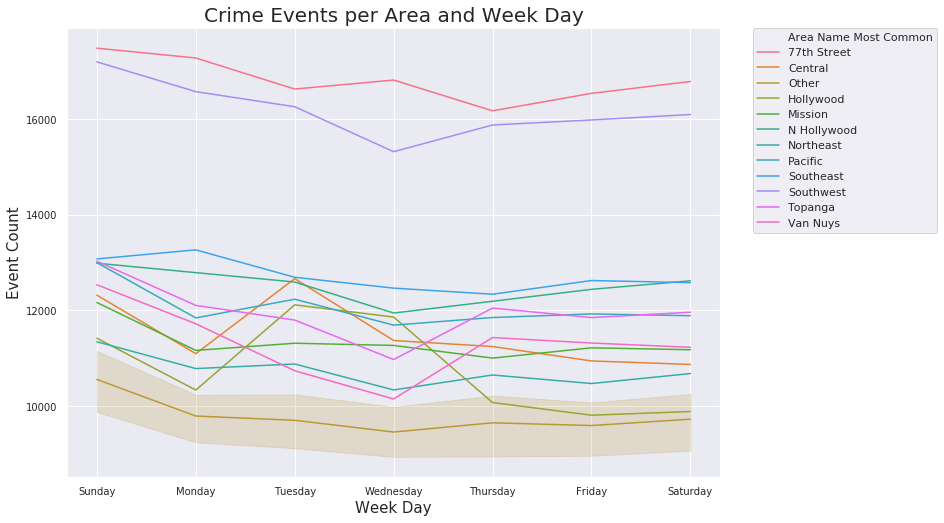

In [19]:
group = data.groupby(['Week Day', 'AREA NAME'])['AREA NAME'].agg(['count'])
results_group = group.reset_index(level=['Week Day',  'AREA NAME'])
results_group = results_group.merge(results_group_area, on = 'AREA NAME')
f, ax = plt.subplots(figsize=(11.7, 8.27))
g = sns.lineplot(ax=ax,x='Week Day', y="count_x", hue='Area Name Most Common',data=results_group)
g.set_title("Crime Events per Area and Week Day", fontsize=20)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Week Day",fontsize=15)
g.tick_params(labelsize=10)
days=["Sunday", "Monday","Tuesday","Wednesday","Thursday","Friday","Saturday"]
plt.xticks(range(len(days)), days)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

### 1.4.6. Analysis by Neighborhood 
We used a geojson file that contains LA's neighborhoods polygons as well as additional features for each neighborhood ([obained from here](https://data.lacity.org/A-Well-Run-City/Neighborhood-Councils-Certified-/fu65-dz2f)) and merged it with a table with estimated features of each neighborhood by the us-census ([obained from here](https://www.kaggle.com/cityofLA/los-angeles-census-data#census-data-by-neighborhood-council.csv)). Using each crime's coordinates we assigned it to a neighborhood.

In [727]:
from geopandas import GeoDataFrame

neiborhoods_df = pd.read_csv('census-data-by-neighborhood-council.csv')
LA_neighborhoods_gdf = gpd.read_file(r'neighborhood_councils_losangeles.geojson')
LA_neighborhoods_gdf['geometry'] = LA_neighborhoods_gdf['geometry'].simplify(0.00005, preserve_topology=True)
LA_neighborhoods_gdf['style'] = [ 
    {'fillColor': [0,0,0], 
    'fillOpacity': 0.0, 
    'weight': 0.2, 
    'color': 'black'}]*len(LA_neighborhoods_gdf)
group_area = data.groupby(['neighborhood'])['neighborhood'].agg(['count']).reset_index()
joined_df = LA_neighborhoods_gdf.set_index('name').join(group_area.set_index('neighborhood'))
neighb_gdf=joined_df.join(neiborhoods_df.set_index('NC_Name'))
neighb_gdf = neighb_gdf[['geometry', 'count', 'Total Population', 'In_Poverty', 'Owner_occ', 'Renter_occ']]
crs = {'init': 'epsg:4326'}
neighb_gdf = GeoDataFrame(neighb_gdf.reset_index(), crs=crs)
neighb_gdf.head()

,name,geometry,count,Total Population,In_Poverty,Owner_occ,Renter_occ
0,MISSION HILLS NC,"POLYGON ((-118.469333 34.280498, -118.467537 3...",8171,22458.37,22138.70,4234.38,1932.35
1,SUNLAND-TUJUNGA NC,"POLYGON ((-118.297041 34.278689, -118.296135 3...",11676,41745.58,41438.09,8490.75,6099.10
2,PICO UNION NC,"POLYGON ((-118.279843 34.051718, -118.268594 3...",16183,39486.37,38732.91,938.14,10972.95
3,FOOTHILL TRAILS DISTRICT NC,"POLYGON ((-118.407334 34.286059, -118.408143 3...",7306,23011.55,22290.62,4837.74,2059.46
4,LAKE BALBOA NC,"POLYGON ((-118.518487 34.186616, -118.518596 3...",16039,43219.20,43104.05,6713.55,7472.35


#### 1.4.6.1. Choropleth - Crime Counts in relative to the population size
Using the Total Population estimation column of each neighborhood we created a choripleth map with the crime count in each neighborhood relative to its population size. This way we hope to create a more objective analysis of the crime count around the city.

In [688]:
neighb_gdf['CrimesPerCapita'] = neighb_gdf.apply(lambda x: round(x['count']/x['Total Population'], 2), axis=1)

m = folium.Map(location = [34.015, -118.26], zoom_start = 10)

a = folium.Choropleth(
    geo_data = neighb_gdf,
    fill_opacity = 0.7,
    line_opacity = 0.2,
    data = neighb_gdf,
    key_on = 'feature.properties.name',
    columns = ['name', 'CrimesPerCapita'],
    fill_color = 'OrRd',
    name='Number of crimes',
    legend_name = 'bi',
    bins=8
)
a.add_to(m)

folium.GeoJson(data=neighb_gdf,
               name='LAPD Neigh.',smooth_factor=2,
               style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.2},
                tooltip=folium.GeoJsonTooltip(fields=['CrimesPerCapita', 'name'],
                                              labels=False,
                                              sticky=False),
               highlight_function=lambda x: {'weight':0.6,'fillColor':'grey'}
              ).add_to(m)
m

We can see that **the most crime-stricken neighborhood in LA is Downtown LA**. 

#### 1.4.6.2. Scatter Plot of the crime counts in respect to the size of population in poverty
Using the In_Poverty estimation column of each neighborhood we created scatter plot with the number of crimes in respect to the number of poor population of the different neighborhoods. 

Text(0.5,0,'Poor Population Number')

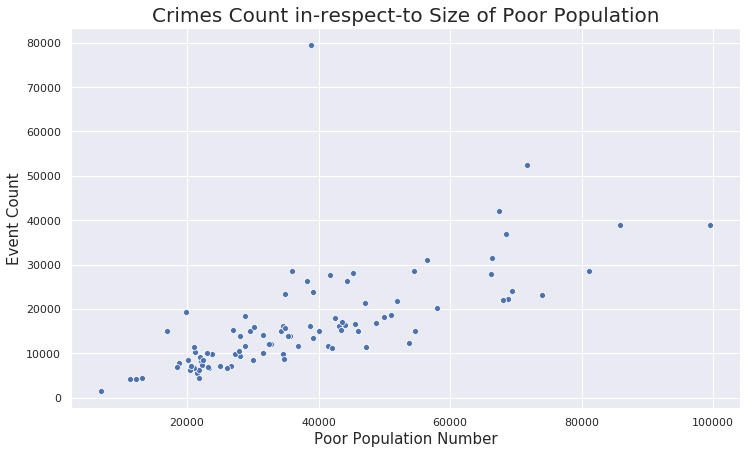

In [726]:
plt.figure(figsize=(12, 7))
corr_df = pd.DataFrame(neighb_gdf[['name', 'count', 'Total Population', 'In_Poverty']])
g = sns.scatterplot(x='In_Poverty', y="count", data=corr_df)
g.set_title("Crimes Count in-respect-to Size of Poor Population", fontsize=20)
g.set_ylabel("Event Count",fontsize=15)
g.set_xlabel("Poor Population Number",fontsize=15)

It seems as if there is a **correlation between the number of poor population of the neighborhood to the amount of crime in the neighborhood**.

# 2. Identifying Related Crime Events using Similarity Measures
Each crime in the dataset is defined by a set of features, including features about the victim, the premis where the crime took place at, the coordinates of the event, the weapon used for the crime, the crime description and the time of the event. In addition to that, each crime is defined by the **Modus Operandi** of the criminal that performed the crime, which refers to the methods the criminals took in order to commit the crime. These are free text descriptions that can go through NLP text analysis and feature extraction. In the following section we present two tools that take advantage of these features to establish links between the crimes using different similarity and clustering measures. The purpose of the tools is to assist law enforcement agencies to solve crimes more easily by finding crimes that were commited by the same criminals/gangs.    

In [7]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import turicreate as tc
import matplotlib.pyplot as plt
import nltk
nltk.download('punkt')
%matplotlib inline

[nltk_data] Downloading package punkt to
[nltk_data]     /data/home/yuvalhef/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## 2.1. Loading MO descriptions and performing word2vec 
The dataset contains only codes of the modus-operandi (MO) descriptions. In the following cells we load the actual MO descriptions and create a document of all the MOs for each crime. We then perform a word2vec on these documents using the Genesim and a trained word2vec model on google-news. 

In [165]:
data_cluster = data.rename(columns={'AREA ': 'AREA'}).reset_index(drop=True)
MO_Codes = pd.read_csv('MO_Codes.csv')

In [134]:
mo_codes_d={}
for i, line in MO_Codes.iterrows():
    mo_codes_d[int(line['MO_Code'])] = line['Description']

In [135]:
import gensim
model = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
import nltk
from nltk.tokenize import word_tokenize
import numpy as np
def txt2vector(txt):
    words = word_tokenize(txt)
    words = [w for w in words if w in model]
    if len(words) != 0:
        return np.mean([model[w] for w in words], axis=0)
    return None

In [166]:
data_cluster = data_cluster[['AREA NAME', 'Crm Cd Desc', 'Mocodes',
       'Vict Age', 'Vict Sex', 'Vict Descent','Crm Cd 1', 'Crm Cd 2', 'Crm Cd 3', 'Weapon Desc', 'Premis Desc', 
       'LAT', 'LON', 'Date Occ Year', 'Month', 'Hour', 'Week Day', 'neighborhood']]

In [167]:
import numpy as np
def from_codes_to_desc(x):
    str_r=''
    for i in x:
        if i is not np.nan and i == i and i!='nan' and i!='-' and i!='':
            if int(i) in mo_codes_d:
                str_r= str_r+' '+mo_codes_d[int(i)]
    return str_r
        
data_cluster['MO_Description'] = data_cluster['Mocodes'].apply(lambda x: from_codes_to_desc(str(x).split(' ')))

In [168]:
from tqdm import tqdm

l = []
crm_codes = ['Crm Cd 2', 'Crm Cd 3']
data_cluster.reset_index(drop=True)
for i in tqdm(range(len(data_cluster))):
    text = data_cluster.iloc[i]["MO_Description"]
    text += data_cluster.iloc[i]["Crm Cd Desc"]
    for crm in data_cluster.iloc[i][crm_codes]:
        if not pd.isnull(crm):
            desc = data[data['Crm Cd']==crm]
            if desc.shape[0] > 0:
                crm_desc = desc.iloc[0]['Crm Cd Desc']
                text += crm_desc
    l.append(txt2vector(text))
data_cluster['word2vec_MO_codes_Description'] = l 

100%|██████████| 1650495/1650495 [1:03:30<00:00, 433.10it/s]


In [169]:
data_cluster.to_csv('final_data.csv')
data_cluster = tc.SFrame(data='final_data.csv')

Finished parsing file /data/home/yuvalhef/bigData/project/final_data.csv

Parsing completed. Parsed 100 lines in 0.214969 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,str,str,str,int,float,str,float,float,str,str,str,float,float,int,int,int,str,str,str,array]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 11782 lines. Lines per second: 34662.3

Read 258962 lines. Lines per second: 47502.6

Read 517181 lines. Lines per second: 48603.7

Read 763806 lines. Lines per second: 48835.6

Read 893104 lines. Lines per second: 42138.8

Read 1151620 lines. Lines per second: 43832.8

Read 1409636 lines. Lines per second: 44939.4

Finished parsing file /data/home/yuvalhef/bigData/project/final_data.csv

Parsing completed. Parsed 1650495 lines in 36.2843 secs.

## 2.2. Dimensionality Reduction 
We want to create for each crime in the dataset a vector that represents it. One part of the vector will be the dense words vector (in length of 300 cells) that we just created. The other part consists of the features in the dataset. Most of these features are categorical with many categories, and thus the when performing one-hot encoding the resulting vectors will be quite sparse and difficult to interperate. For that reason, after performing one-hot encoding we take the vectors through a dimentionality reduction module - PCA, and result in a denser representation. We take the dense vector and concatenate it to the words vector to recieve the final vector that represents the crime. 

In [171]:
data_cluster = data_cluster[['AREA NAME', 'Vict Age', 'Vict Sex', 'Vict Descent', 'LAT', 'LON', 'Date Occ Year', 'Month', 'Hour', 'Week Day', 'neighborhood',
                   'word2vec_MO_codes_Description', 'MO_Description', 'Crm Cd Desc', 'Weapon Desc', 'Premis Desc']]
data_cluster = data_cluster.fillna('Weapon Desc', "UNKNOWN")
data_cluster = data_cluster.fillna('Premis Desc', "UNKNOWN")
data_cluster = data_cluster.dropna()

In [178]:
from tqdm import tqdm
X = []
df = data_cluster.to_dataframe()
data_cluster['mo_arrays'] = df['word2vec_MO_codes_Description']
df = df.rename(columns={'word2vec_MO_codes_Description': 'mo_arrays'})
df_pca = df[['AREA NAME', 'Vict Age', 'Vict Sex', 'Vict Descent', 'LAT', 'LON', 'Date Occ Year', 'Hour', 'Week Day',
             'neighborhood', 'Weapon Desc', 'Premis Desc']]

data_pca = pd.get_dummies(df_pca)

In [173]:
from sklearn.decomposition import PCA
pca = PCA(n_components=10)
sf_pca = tc.SFrame(pca.fit_transform(data_pca))
df['vectors'] = data_cluster['vectors'] = sf_pca['X1']

## 2.3. K-Nearest Neighbors Model 
After we obtained the vectors representing the crimes we can now use them to create a nearest-neighbors model. The model can be used to find the k most similar crimes (neighbors) of a certain crime and thus look for crimes commited by the same criminals. We used TuriCreate's nearest_neighbors module:

In [179]:
knn_model = tc.nearest_neighbors.create(tc.SFrame(data_cluster['vectors', 'mo_arrays']))

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

### 2.3.1. K-NN Use Case Example: 
Lets use the model for **crime number 5** in the dataset as an example. Here are this crime's details:

In [222]:
features = ['AREA NAME', 'Crm Cd Desc', 'Vict Age', 'Vict Sex', 'Vict Descent', 'LAT', 'LON', 'Date Occ Year', 'Month', 
             'Hour', 'Week Day', 'neighborhood', 'MO_Description', 'Weapon Desc', 'Premis Desc']
data_cluster[features][5]

{'AREA NAME': 'Central',
 'Crm Cd Desc': 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
 'Vict Age': 51,
 'Vict Sex': 1.0,
 'Vict Descent': 'Black',
 'LAT': 34.0435,
 'LON': -118.2427,
 'Date Occ Year': 2010,
 'Month': 1,
 'Hour': 21,
 'Week Day': 'Friday',
 'neighborhood': 'DOWNTOWN LOS ANGELES',
 'MO_Description': 'Hit-Hit w/ weapon',
 'Weapon Desc': 'UNKNOWN WEAPON/OTHER WEAPON',
 'Premis Desc': 'OTHER PREMISE'}

In [223]:
query = knn_model.query(tc.SFrame(data_cluster['vectors', 'mo_arrays'])[5:6], k=10)
query

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 1       | 6.09545e-05 | 7.978ms      |

| Done         |         | 100         | 2.47s        |

+--------------+---------+-------------+--------------+

query_label,reference_label,distance,rank
0,5,0.0,1
0,213411,1.5100847272699494,2
0,13596,1.767552870558575,3
0,292909,1.7988363075805187,4
0,242640,1.9590637222710203,5
0,64232,2.0194287632655032,6
0,134279,2.051140762142588,7
0,312602,2.05648953709473,8
0,432407,2.0848731681892017,9
0,264485,2.110276400431257,10


We can see that **crime number 213411 is the most similar to crime 5**. In the following cell we can see that this crime is indeed similar to crime number 5:

In [224]:
data_cluster[features][213411]

{'AREA NAME': 'Wilshire',
 'Crm Cd Desc': 'ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT',
 'Vict Age': 52,
 'Vict Sex': 1.0,
 'Vict Descent': 'Black',
 'LAT': 34.0449,
 'LON': -118.3411,
 'Date Occ Year': 2011,
 'Month': 4,
 'Hour': 21,
 'Week Day': 'Sunday',
 'neighborhood': 'MID CITY NC',
 'MO_Description': 'Hit-Hit w/ weapon',
 'Weapon Desc': 'KNIFE WITH BLADE 6INCHES OR LESS',
 'Premis Desc': 'MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)'}

## 2.4. Tool 1 - Similar Crimes Map Visualization
In the first tool we present, we use the **display_neighbors** function that given an index (id) of the queried crime and the requested number of neighbors (k), it displays on a Plotly's interactive map of LA the k most similar crimes that were reported in the past. Each crime is represented as a circle with a different size which is determined by the distance to the queried crime. The more similar the crime is, the larger the circle is. The details of each crime are visible when hovering over the circle. In the following cells we display 2 use-cases as examples. 

In [213]:
from plotly_express import ExpressFigure

def display_neighbors(data, crime_idx, knn_model=None, k=10):
    """
    Plots an interactive map with the queried crime and the k most similar crimes to it.
    Args:
        param1: data.
        param2: crime_idx. the index (id) of the crime you want to query.
        param3: knn_model. a trained knn model, if exists.
        param4: k. the number of neighbors to display on the map
    Returns:
        fig. the interactive map. 
    """
    if not knn_model:
        knn_model = tc.nearest_neighbors.create(tc.SFrame(data['vectors', 'mo_arrays']))
    model_vectors = tc.SFrame(data[['vectors', 'mo_arrays']])
    query = knn_model.query(model_vectors[crime_idx:crime_idx+1], k=k)
    px.set_mapbox_access_token('pk.eyJ1IjoiY2hyaWRkeXAiLCJhIjoiY2ozcGI1MTZ3MDBpcTJ3cXR4b3owdDQwaCJ9.8jpMunbKjdq1anXwU5gxIw')
    df_neihg = data.iloc[list(query['reference_label'])].reset_index(drop=True)
    l = list(query['rank'])
    l.reverse()
    df_neihg['size'] = [i/k for i in l]
    df_neihg['queried crime'] = ['NO']*k
    df_neihg['queried crime'][0] = 'Yes'
    features = ['AREA NAME', 'Crm Cd Desc', 'Vict Age', 'Vict Sex', 'Vict Descent', 'Date Occ Year', 'Month', 
                 'Hour', 'Week Day', 'neighborhood', 'MO_Description', 'Premis Desc', 'Weapon Desc']
    fig1 = px.scatter_mapbox(df_neihg, lat="LAT", lon="LON",  size='size', color="queried crime",
                      color_discrete_sequence=px.colors.qualitative.Alphabet, size_max=k, zoom=9.25, hover_data=features)
    lo = fig1.layout
    lo['title'] = f'Crimes That are Related to Crime No. {crime_idx}'
    fig = ExpressFigure(data=list(fig1.data), layout=lo)
    return fig

In [214]:
display_neighbors(df, crime_idx=15, knn_model, k=15)

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 1       | 6.09545e-05 | 6.986ms      |

| Done         |         | 100         | 2.62s        |

+--------------+---------+-------------+--------------+

In [215]:
display_neighbors(df, crime_idx=1600000, knn_model, k=8)

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 1       | 6.09545e-05 | 7.563ms      |

| Done         |         | 100         | 2.67s        |

+--------------+---------+-------------+--------------+

## 2.5. Tool 2 - Crimes Clusters Map Visualization
In the second tool we present, we use the **display_clusters** function that given a crime type (e.g., Theft), an LAPD area, a year and months of that year produces clusters of crimes that occored at this area in those times and visualize them on a Plotly's interactive map. Similarly to what we previously presented in this section, the relevant examples of the data (after filtering by area and time) goes through PCA dim reduction along with the MO documents' word vectors. The function's **consider_victim** parameter enables the user to determine whether to use features about the victim or not. For example in car theft the victim's features might be less relevant so the user might choose not to use them. For creating the clusters we used 2 different methods that can be chosen by the **c_type** parameter:

### 2.5.1. First Cluster method - k-means
"k-means clustering is a method of vector quantization, originally from signal processing, that is popular for cluster analysis in data mining. k-means clustering aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster. This results in a partitioning of the data space into Voronoi cells". (Wikipedia). When this option is chosen, a TuriCreate k-means model is constructed and the data is partitioned to n clusters (defined by the **n_clusters** parameter that should be chosen by the user).

### 2.5.2. Second Cluster method - communities in a similarity graph
If the chosen type is "similarity_graph", a nearest-neighbors model is created with TuriCreate and this model is used to construct a similarity graph of the different crimes. The SGraph object is transformed into a Networkx graph which is being partitioned into cummunities with the help of **greedy_modularity_communities** module. The crimes of the different comunitues are visualized over an interactive map. In addition, the networkx graph is transformed once again to a **pyvis** library's graph so that the nodes would be plotted on an interactive graph which enables to display the information of each node (crime) when hovering over the node and to color the node according to its community.

In [244]:
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
from pyvis.network import Network

def display_clusters(data, consider_victim=True, c_type='kmeans', crime_type='BURGLARY', area='Hollywood', year=2015, months=[3, 4, 5], n_clusters=6):
    """
    Plots an interactive map with the clusters of crimes (and a graph in some cases)
    Args:
        param1: data.
        param2: consider_victim. Boolean to decide whether to use features of the victims or not.
        param3: c_type. str to determine the method to use for clustering ('kmeans'/'similarity_graph').
        param4: crime_type. str to decide which crime types to focus on.
        param5: area. LAPD division area to focus on.
        param6: year. which year to filter the data by.
        param7: months. which months of that year to filter the data by.
        param8: n_clusters. number of clusters to use (only when using kmeans).
    Returns:
        fig1, the interactive map and G, the interactive graph plot (only on similarity_graph). 
    """     
    features = ['LAT', 'LON', 'Date Occ Year', 'Hour', 'Week Day', 'neighborhood', 'Weapon Desc', 'Premis Desc']
    if consider_victim:
        features+=['Vict Age', 'Vict Sex', 'Vict Descent']
    disp_features = ['Vict Age', 'Vict Sex', 'Vict Descent', 'Hour', 'Week Day', 'neighborhood', 'MO_Description', 
                     'Premis Desc', 'Weapon Desc']
    crimes = [i for i in data['Crm Cd Desc'].unique().tolist() if crime_type in i]
    data = data[data['Crm Cd Desc'].isin(crimes)]
    data = data[data['AREA NAME']==area]
    data = data[data['Date Occ Year']==year]
    data = data[data['Month'].isin(months)]
    data = data.reset_index(drop=True)
    data.rename(columns={'word2vec_MO_codes_Description': 'mo_arrays'})
    df_pca = data[features]
    data_pca = pd.get_dummies(df_pca)
    pca = PCA(n_components=10)
    sf_pca = tc.SFrame(pca.fit_transform(data_pca))
    data['vectors'] = sf_pca['X1']
    
    if c_type=='kmeans':
        kmeans_model = tc.kmeans.create(tc.SFrame(data[['vectors', 'mo_arrays']]), num_clusters=n_clusters)
        data['row_id'] = range(0, data.shape[0])
        data = data.merge(kmeans_model.cluster_id.to_dataframe(), on = 'row_id')
        G = None
        
    elif c_type=='similarity_graph':
        knn_model = tc.nearest_neighbors.create(tc.SFrame(data[['vectors', 'mo_arrays']]))
        sg = knn_model.similarity_graph(k=5)
        g = nx.Graph()
        G = Network(notebook=True, height='500px', width='1100px')
        for v in sg.vertices['__id']:
            g.add_node(v, attr_dict=dict(zip(disp_features, data.iloc[v][disp_features])))
            G.add_node(v, title=str(dict(zip(disp_features, data.iloc[v][disp_features]))))

        for e in sg.edges:
            g.add_edge(e["__src_id"], e["__dst_id"])
            G.add_edge(e["__src_id"], e["__dst_id"])
        c = list(greedy_modularity_communities(g))
        data['cluster_id'] = np.zeros(len(data))
        print(len(c))
        for i in range(len(c)):
            data['cluster_id'].loc[list(c[i])] = i
        for n in G.nodes:
            n['group'] = data['cluster_id'].loc[n['id']]
            
    px.set_mapbox_access_token('pk.eyJ1IjoiY2hyaWRkeXAiLCJhIjoiY2ozcGI1MTZ3MDBpcTJ3cXR4b3owdDQwaCJ9.8jpMunbKjdq1anXwU5gxIw')
    data['cluster_id'] = data['cluster_id'].astype(str)
    fig1 = px.scatter_mapbox(data, lat="LAT", lon="LON", color="cluster_id",
                      size_max=10, zoom=12.25, hover_data=disp_features)
    lo = fig1.layout
    lo['title'] = f'{crime_type} Crimes Clusters in Months {", ".join(str(x) for x in months)} of {year} at the LAPD Area of {area} using {type} method'
    lo.font.size = 10
    fig = ExpressFigure(data=list(fig1.data), layout=lo)
    
    return fig1, G
    

### 2.5.3. Use Case 1 
We use kmeans to display the clusters of "BURGLARY FROM VEHICLE" crimes that took place between march and may of 2015 in the Hollywood area. Hover over the points to see the crime information. If you wish to look at only one crimes-cluster at a time, double-click the cluster you want in the legend in the upper right-hand side of the map. 

In [226]:
fig, _ = display_clusters(df.iloc[:,:-1], consider_victim=False, c_type='kmeans', crime_type='BURGLARY FROM VEHICLE', area='Hollywood')
fig

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 27        |

| 1             | 75        |

| 2             | 10        |

| 3             | 71        |

| 4             | 187       |

| 5             | 164       |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 21                            |

| 2         | 16                            |

| 3         | 8                             |

| 4         | 10                            |

| 5         | 2                             |

| 6         | 0                             |

+-----------+-------------------------------+

### 2.5.4. Use Case 2 
We use kmeans to display the clusters of "ASSAULT" crimes that took place in June and July of 2010 in the Central area. We use 12 clusters this time and take the victims fetures into consideration. Hover over the points to see the crime information. If you wish to look at only one crimes-cluster at a time, double-click the cluster you want in the legend in the upper right-hand side of the map. 

In [228]:
f, _ = display_clusters(df.iloc[:,:-1], consider_victim=True, c_type='kmeans', crime_type='ASSAULT', area='Central', n_clusters=12, 
                year=2010, months=[6,7])
f

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 138       |

| 1             | 284       |

| 2             | 305       |

| 3             | 173       |

| 4             | 66        |

| 5             | 3         |

| 10            | 60        |

| 11            | 40        |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 35                            |

| 2         | 20                            |

| 3         | 5                             |

| 4         | 8                             |

| 5         | 8                             |

| 6         | 5                             |

| 7         | 6                             |

| 8         | 2                             |

| 9         | 1                             |

| 10        | 0                             |

+-----------+-------------------------------+

### 2.5.5. Use Case 3 
We use similarity graph to display the clusters of "RAPE" crimes that took place between january and may of 2012 in the 77th Street area. We take the victims fetures into consideration. Hover over the points to see the crime information. Here **we also plot the resulting similarity graph interactively**, where each node color represents a different community. Hover over the nodes of the graph to see the details of the crimes.

In [245]:
f, g = display_clusters(df.iloc[:,:-1], consider_victim=True, c_type='similarity_graph', crime_type='RAPE', area='77th Street',
                year=2012, months=[1, 2, 3, 4, 5])
f

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 1            | 49      | 2.04082     | 4.247ms      |

| Done         |         | 100         | 6.082ms      |

+--------------+---------+-------------+--------------+

5


In [246]:
g.show('f.html')

### 2.5.6. Use Case 4 
We use similarity graph to display the clusters of "HOMICIDE" crimes that took place between January and October of 2018 in the Central area. We take the victims fetures into consideration. Hover over the points to see the crime information. Here **we also plot the resulting similarity graph interactively**, where each node color represents a different community. Hover over the nodes of the graph to see the details of the crimes.

In [242]:
f, g = display_clusters(df.iloc[:,:-1], consider_victim=True, type='similarity_graph', crime_type='HOMICIDE', area='Central', n_clusters=12, 
                year=2018, months=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
f

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 1            | 12      | 8.33333     | 1.807ms      |

| Done         |         | 100         | 2.394ms      |

+--------------+---------+-------------+--------------+

2


In [243]:
g.show('g.html')

# 3. Classification of the weapon in use by NLP analysis and Clustering
First, we need to understand what is the percentage of crimes in which the weapon that was used by the criminals is unknown or not reported:

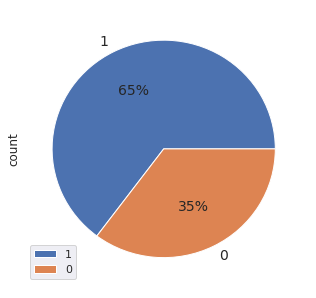

In [283]:
df['Weapon Desc'] = df['Weapon Desc'].replace('', 'UNKNOWN')
df['Weapon unknown'] = df['Weapon Desc'].str.contains('UNKNOWN|unknown|unkn', regex=True) 
Weapon_unknown = df[['Weapon unknown']]
group = Weapon_unknown.groupby(["Weapon unknown"])['Weapon unknown'].agg(['count'])
group = group.reset_index(level=['Weapon unknown'])
group = group.sort_values("count", ascending=False)
group.plot.pie(y='count', figsize=(5, 5),autopct='%1.0f%%', textprops={'fontsize': 14})

In 35% of the crimes the weapon that was in use by the gang\criminal is unknown, we will try to build a classifier that classifies which weapon was in use. This can assit the police to solve crimes by predicting the type of weapon that was used. we will drop the rows that the weapon is unknown and group the weapons into 5 main categories. 

In [284]:
# data_initial = pd.read_csv("Crime_Data_from_2010_to_Present.csv")
keys =  data_initial['Weapon Desc'].unique().tolist()[1:]
weapons_dict = {}
for key in keys:
    val = data_initial[data_initial['Weapon Desc']==key]['Weapon Used Cd'].reset_index(drop=True)[0]
    weapons_dict[key] = val
df = df[df['Weapon unknown']==0]
df['Weapon Used Cd'] = df['Weapon Desc'].apply(lambda x: weapons_dict[x])
df['Target'] = df['Weapon Used Cd'].apply(lambda x: 'Gun' if x<150 else 'Knife' if 199<x<250 else 'Bat' if 299<x<350 
                                              else 'Arm' if 399<x<450 else 'Other Weapon')

Then, we will build a baseline classifier, constructing features using NLP tools, and we will try to improve it by adding a clustering feature (adding the cluster that the crime belongs to as a feature for the classifier) that should express the connection between the crimes characters. 

### 3.1. Adding NLP features
We use the Modus Operandi text document and the crime description and apply N-Grams and Bag-of-Words for feature extraction out of the free texts. 

In [ ]:
sf_cluster = tc.SFrame(df)

sf_cluster['words_1grams_MO_Description'] = tc.text_analytics.count_ngrams(sf_cluster['MO_Description'], n=1, method='word')
sf_cluster['words_2grams_MO_Description'] = tc.text_analytics.count_ngrams(sf_cluster['MO_Description'], n=2, method='word')
sf_cluster['words_dict_MO_Description'] = tc.text_analytics.count_words(sf_cluster['MO_Description'])

sf_cluster['words_1grams_Crm_Cd'] = tc.text_analytics.count_ngrams(sf_cluster['Crm Cd Desc'], n=1, method='word')
sf_cluster['words_2grams_Crm_Cd'] = tc.text_analytics.count_ngrams(sf_cluster['Crm Cd Desc'], n=2, method='word')
sf_cluster['words_dict_Crm_Cd'] = tc.text_analytics.count_words(sf_cluster['Crm Cd Desc'])

**Runing the baseline model:**

In [285]:
train, test = sf_cluster.random_split(0.8)
cls_base_line = tc.classifier.create(train, features=['words_1grams_MO_Description','words_2grams_MO_Description','words_dict_MO_Description','words_1grams_Crm_Cd',
'words_2grams_Crm_Cd','words_dict_Crm_Cd','Vict Age', 'Vict Sex', 'Vict Descent','LAT', 'LON', 'Date Occ Year', 'Week Day','Hour'], target="Target")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: BoostedTreesClassifier, RandomForestClassifier, DecisionTreeClassifier, LogisticClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 439172

Number of classes           : 5

Number of feature columns   : 14

Number of unpacked features : 26145

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.704614     | 0.876281          | 0.876055            | 1.104178          | 1.106185            |

| 2         | 3.400640     | 0.877841          | 0.876876            | 0.861595          | 0.865042            |

| 3         | 5.113610     | 0.878330          | 0.876401            | 0.710521          | 0.715140            |

| 4         | 6.795620     | 0.880823          | 0.877958            | 0.608513          | 0.613739            |

| 5         | 8.562071     | 0.880227          | 0.878391            | 0.537367          | 0.542781            |

| 10        | 17.150891    | 0.886639          | 0.884274            | 0.386314          | 0.393201            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Random forest classifier:

--------------------------------------------------------

Number of examples          : 439172

Number of classes           : 5

Number of feature columns   : 14

Number of unpacked features : 26145

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.763645     | 0.876103          | 0.874497            | 0.497549          | 0.502545            |

| 2         | 3.232770     | 0.876914          | 0.875968            | 0.497181          | 0.501713            |

| 3         | 4.698537     | 0.875816          | 0.874584            | 0.496157          | 0.501050            |

| 4         | 6.187340     | 0.875306          | 0.874540            | 0.495871          | 0.500843            |

| 5         | 7.609259     | 0.875648          | 0.874194            | 0.495349          | 0.500425            |

| 10        | 14.909392    | 0.876115          | 0.875016            | 0.495136          | 0.499602            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Decision tree classifier:

--------------------------------------------------------

Number of examples          : 439172

Number of classes           : 5

Number of feature columns   : 14

Number of unpacked features : 26145

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.563038     | 0.876281          | 0.876055            | 0.497058          | 0.501198            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 439172

Number of classes           : 5

Number of feature columns   : 14

Number of unpacked features : 26145

Number of coefficients      : 104676

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.325785     | 0.835579          | 0.835042            |

| 1         | 4        | 1.000000  | 2.085080     | 0.859297          | 0.858014            |

| 2         | 5        | 1.000000  | 3.844707     | 0.873125          | 0.871512            |

| 3         | 6        | 1.000000  | 5.611476     | 0.883342          | 0.877309            |

| 4         | 7        | 1.000000  | 7.221248     | 0.889105          | 0.880684            |

| 9         | 17       | 1.000000  | 16.592530    | 0.899862          | 0.885788            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: BoostedTreesClassifier          : 0.8842742807700628
PROGRESS: RandomForestClassifier          : 0.8750162232316677
PROGRESS: DecisionTreeClassifier          : 0.8760545100584036
PROGRESS: LogisticClassifier              : 0.8857884490590525
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


**Evaluating the baseline model on the test set:**

In [287]:
results_base_line = cls_base_line.evaluate(test)
results_base_line

{'accuracy': 0.8868225108225108,
 'auc': 0.9570272055759771,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 25
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 | Other Weapon |       Gun       |  196  |
 |    Knife     |       Bat       |  699  |
 |    Knife     |      Knife      |  5459 |
 |     Bat      |   Other Weapon  |  130  |
 |     Gun      |       Arm       |  1013 |
 |     Arm      |   Other Weapon  |  765  |
 | Other Weapon |      Knife      |  334  |
 | Other Weapon |   Other Weapon  | 10293 |
 |     Bat      |       Gun       |   96  |
 |    Knife     |       Gun       |  599  |
 +--------------+-----------------+-------+
 [25 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'f1_score': 0.7556991275890589,
 'log_loss': 0.3608117750560385,

**Results:** The random baseline is 0.2 accuracy (5 class) and our baseline model achieved 0.887 . Now lets try to improve it by adding a clustering feature.

### 3.2. Adding Clustering as Additional Feature

Decide on the number of clusters using the elbow method.

In [321]:
df = df.reset_index(drop=True)
np_data = np.array([df['mo_arrays'].values[i].tolist() + df['vectors'].values[i].tolist() for i in range(df.shape[0])])
np_data.shape

(577787, 310)

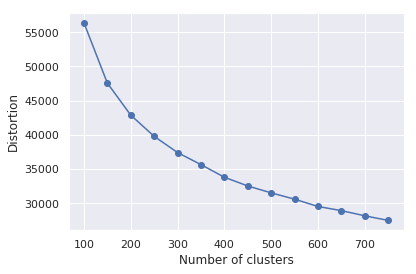

In [323]:
# calculate distortion for a range of number of cluster
distortions = []
for i in range(100, 800, 50):
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0, verbose =False
    )
    km.fit(np_data)
    distortions.append(km.inertia_)

# plot
plt.plot(range(100, 800, 50), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

We choose **350 clusters** according to this graph and create the k-means model:

In [324]:
kmeans_model = tc.kmeans.create(data_cluster['vectors', 'mo_arrays'], num_clusters=350)

Batch size is larger than the input dataset. Switching to an exact Kmeans method.

Choosing initial cluster centers with Kmeans++.

+---------------+-----------+

| Center number | Row index |

+---------------+-----------+

| 0             | 378393    |

| 1             | 357225    |

| 2             | 259247    |

| 3             | 335717    |

| 4             | 170970    |

| 5             | 167127    |

| 10            | 274588    |

| 50            | 412769    |

| 100           | 253769    |

| 250           | 71035     |

| 349           | 108507    |

+---------------+-----------+

Starting kmeans model training.

Assigning points to initial cluster centers.

+-----------+-------------------------------+

| Iteration | Number of changed assignments |

+-----------+-------------------------------+

| 1         | 414758                        |

| 2         | 184678                        |

| 3         | 113265                        |

| 4         | 83620                         |

| 5         | 65070                         |

| 6         | 51770                         |

| 7         | 42369                         |

| 8         | 35402                         |

| 9         | 31557                         |

| 10        | 28421                         |

+-----------+-------------------------------+

WARNING: Clustering did not converge within max_iterations.

In [325]:
kmeans_model.summary()

Class                            : KmeansModel

Schema
------
Number of clusters               : 350
Number of examples               : 1640568
Number of feature columns        : 2
Number of unpacked features      : 310
Row label name                   : row_id

Training Summary
----------------
Training method                  : elkan
Number of training iterations    : 10
Batch size                       : 1640568
Total training time (seconds)    : 34.1689

Accessible fields
-----------------
cluster_id                      : An SFrame containing the cluster assignments.
cluster_info                    : An SFrame containing the cluster centers.


In [326]:
kmeans_model.cluster_info.print_rows(num_columns=5, max_row_width=80, max_column_width=10)

+-----------+-----------+------------+------+-----------+
| mo_arrays |  vectors  | cluster_id | size | sum_sq... |
+-----------+-----------+------------+------+-----------+
| [0.086... | [-0.65... |     0      | 5696 | 12609.... |
| [0.091... | [-20.2... |     1      | 6435 | 16921.... |
| [0.088... | [6.916... |     2      | 5197 | 12878.... |
| [0.087... | [-9.80... |     3      | 4371 | 13611.... |
| [0.060... | [29.04... |     4      | 3498 | 14115.... |
| [0.089... | [12.78... |     5      | 4691 | 16099.... |
| [0.090... | [-6.68... |     6      | 5204 | 11644.... |
| [0.082... | [20.43... |     7      | 4794 | 15944.... |
| [0.086... | [5.956... |     8      | 6791 | 17288.... |
| [0.095... | [-16.9... |     9      | 195  | 11968.... |
+-----------+-----------+------------+------+-----------+
[350 rows x 5 columns]



In [327]:
kmeans_model.cluster_info[['cluster_id', 'size', 'sum_squared_distance']]

cluster_id,size,sum_squared_distance
0,5696,12609.982966542244
1,6435,16921.813606381416
2,5197,12878.48165011406
3,4371,13611.121342658997
4,3498,14115.238907337189
5,4691,16099.069780230522
6,5204,11644.222521781921
7,4794,15944.837131023407
8,6791,17288.838856339455
9,195,11968.831288814545


In [328]:
kmeans_model.cluster_id.head()

row_id,cluster_id,distance
0,95,2.348529100418091
1,298,2.7105205059051514
2,31,2.5994155406951904
3,205,1.567879319190979
4,329,2.789830446243286
5,134,2.6156082153320312
6,96,2.2251510620117188
7,44,2.235132932662964
8,226,2.7668075561523438
9,190,2.873382806777954


**Addnig a column** to the dataset with the cluster each crime belongs to:

In [333]:
df['row_id'] = range(0,df.shape[0])

In [335]:
df_joined = df.merge(kmeans_model.cluster_id.to_dataframe(), on = 'row_id')

Now we will **add the cluster as a feature** for the prediction of the crime hour classification task and we will check if the classification results improves

In [336]:
train, test = tc.SFrame(df_joined).random_split(0.8)
cls_with_cluster = tc.classifier.create(train,features=['words_1grams_MO_Description','words_2grams_MO_Description','words_dict_MO_Description','words_1grams_Crm_Cd',
'words_2grams_Crm_Cd','words_dict_Crm_Cd','Vict Age', 'Vict Sex', 'Vict Descent','LAT', 'LON', 'Date Occ Year', 'Week Day','cluster_id','distance','Hour'], target="Target")

PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: BoostedTreesClassifier, RandomForestClassifier, DecisionTreeClassifier, LogisticClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 439343

Number of classes           : 5

Number of feature columns   : 16

Number of unpacked features : 26257

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.851264     | 0.876812          | 0.875108            | 1.103994          | 1.105098            |

| 2         | 3.705783     | 0.877574          | 0.875930            | 0.861276          | 0.863067            |

| 3         | 5.508923     | 0.878956          | 0.877400            | 0.710206          | 0.712393            |

| 4         | 7.206329     | 0.879488          | 0.877357            | 0.608248          | 0.611304            |

| 5         | 9.035567     | 0.880779          | 0.878957            | 0.537098          | 0.540690            |

| 10        | 17.877848    | 0.885716          | 0.884665            | 0.385953          | 0.392273            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Random forest classifier:

--------------------------------------------------------

Number of examples          : 439343

Number of classes           : 5

Number of feature columns   : 16

Number of unpacked features : 26257

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.632302     | 0.876632          | 0.874632            | 0.497136          | 0.500021            |

| 2         | 3.006882     | 0.876629          | 0.874200            | 0.496641          | 0.499388            |

| 3         | 4.415389     | 0.876641          | 0.874935            | 0.496057          | 0.498837            |

| 4         | 5.826649     | 0.875653          | 0.873551            | 0.495744          | 0.498454            |

| 5         | 7.259385     | 0.875749          | 0.873811            | 0.495726          | 0.498543            |

| 10        | 14.172494    | 0.875753          | 0.873767            | 0.495417          | 0.498241            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Decision tree classifier:

--------------------------------------------------------

Number of examples          : 439343

Number of classes           : 5

Number of feature columns   : 16

Number of unpacked features : 26257

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 1.540680     | 0.876812          | 0.875108            | 0.496863          | 0.499922            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 439343

Number of classes           : 5

Number of feature columns   : 16

Number of unpacked features : 26257

Number of coefficients      : 105124

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.310421     | 0.834944          | 0.834544            |

| 1         | 4        | 1.000000  | 2.192065     | 0.859552          | 0.856426            |

| 2         | 5        | 1.000000  | 3.795030     | 0.874030          | 0.869573            |

| 3         | 6        | 1.000000  | 5.417189     | 0.883560          | 0.878265            |

| 4         | 7        | 1.000000  | 7.046875     | 0.889833          | 0.882287            |

| 9         | 17       | 0.965336  | 16.006693    | 0.899903          | 0.887260            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: BoostedTreesClassifier          : 0.884665282823041
PROGRESS: RandomForestClassifier          : 0.8737675142708874
PROGRESS: DecisionTreeClassifier          : 0.8751081127832555
PROGRESS: LogisticClassifier              : 0.8872599896211728
PROGRESS: ---------------------------------------------
PROGRESS: Selecting LogisticClassifier based on validation set performance.


Evaluating the improved classifier on the test set:

In [337]:
results_with_cluster = cls_with_cluster.evaluate(test)
results_with_cluster

{'accuracy': 0.8861949358307318,
 'auc': 0.9579069136920368,
 'confusion_matrix': Columns:
 	target_label	str
 	predicted_label	str
 	count	int
 
 Rows: 25
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |     Arm      |      Knife      |  432  |
 |     Gun      |       Bat       |  235  |
 | Other Weapon |       Gun       |  194  |
 |    Knife     |       Bat       |  709  |
 |    Knife     |      Knife      |  5431 |
 |     Bat      |   Other Weapon  |  145  |
 | Other Weapon |   Other Weapon  | 10301 |
 |     Bat      |       Gun       |   77  |
 |    Knife     |       Gun       |  642  |
 |     Gun      |       Arm       |  1025 |
 +--------------+-----------------+-------+
 [25 rows x 3 columns]
 Note: Only the head of the SFrame is printed.
 You can use print_rows(num_rows=m, num_columns=n) to print more rows and columns.,
 'f1_score': 0.7564963927149355,
 'log_loss': 0.35875626480655814

We can see that neither the accuracy results nor the AUC results improved from the baseline results. **Thus, we shouldn't use the clustering features.**

# 4. Summary
Exploring the data, we revealed what are the most common crime types in Los-Angeles and in which areas of LA each type occurs the most. We analyzed the data regarding the victims of the crimes and showed that most victims are in their twenties and that there is a strong correlation between the location of the crime and the descent of the victim. We also analyzed the weapons that were used and which are more common in each hour of the day. With heat-map and choropleth maps we displayed which areas of LA are more crime-stricken and presented how the time (hour of the day, day of week) influences the amount of crime in the different neighborhoods and showed in which neighborhoods the number of crimes increased over the recent years and in which areas it stayed the same.  

Using NLP, dimentionality reduction methods and more we constructed tools that can assist law enorcement agencies to find relations and links between crime events. We used the nearest-neighbors algorithm to display on a map the most similar crimes to an investigated crime. We also used k-means and communities detection in a similarity graph to divide crimes into clusters and displayed them on a map.  

Finally, using NLP feature extraction tools we developed a classifier to predict the weapons that was used in crimes. This classifier can be used to complete the investigation in crimes in which the investigators don't know what is the weapon that was used. 